In [1]:
import scanpy as sc
from glob import glob
import matplotlib.pyplot as plt

In [10]:
# h5ad_paths = glob('output/*h5ad')
h5ad_paths = glob('/home/ubuntu/Documents/spatial_annot/20240117/*h5ad')
h5ad_paths

['/home/ubuntu/Documents/spatial_annot/20240117/WTSI_wEMBsp13458606_anndata_with_annotations.h5ad',
 '/home/ubuntu/Documents/spatial_annot/20240117/WTSI_wEMBsp13458601_anndata_with_annotations.h5ad',
 '/home/ubuntu/Documents/spatial_annot/20240117/WTSI_wEMBsp13458609_anndata_with_annotations.h5ad',
 '/home/ubuntu/Documents/spatial_annot/20240117/WTSI_wEMBsp13458120_anndata_with_annotations.h5ad',
 '/home/ubuntu/Documents/spatial_annot/20240117/WTSI_wEMBsp13458130_anndata_with_annotations.h5ad',
 '/home/ubuntu/Documents/spatial_annot/20240117/WTSI_wEMBsp13458133_anndata_with_annotations.h5ad']

In [ ]:
h5ad_paths = glob('/nfs/team283_imaging/NJ_EMB/playground_Tong/label_transfer_20231213/transposed_for_Grant/*h5ad')
h5ad_paths

WTSI_wEMBsp13458606_anndata_with_annotations.h5ad


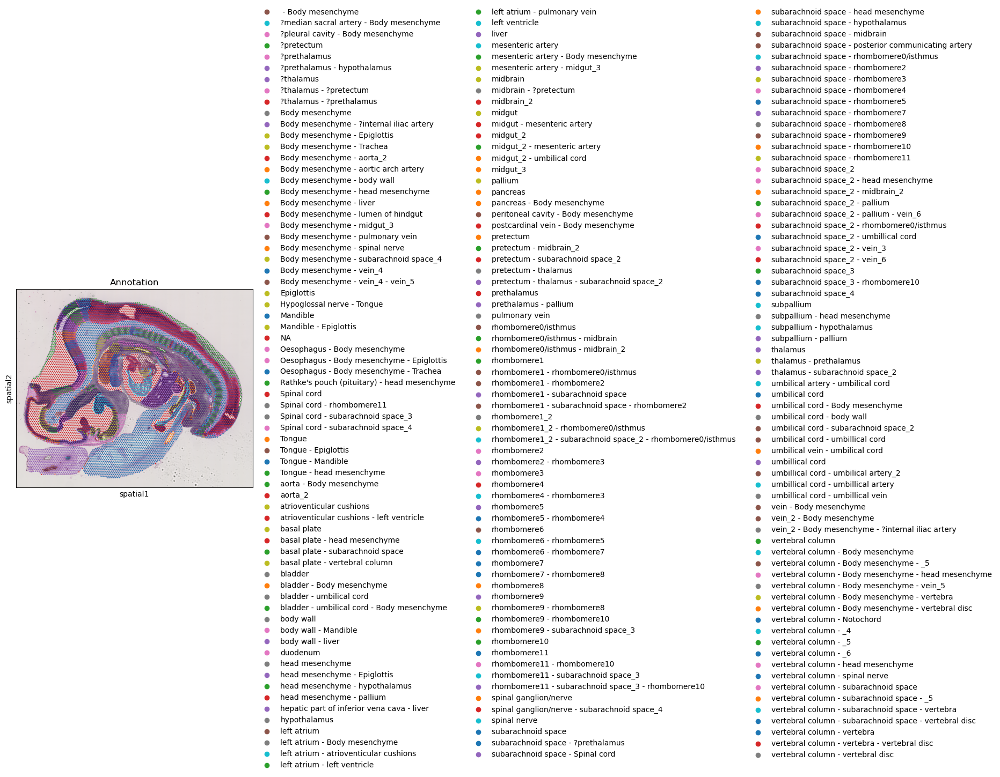

WTSI_wEMBsp13458601_anndata_with_annotations.h5ad


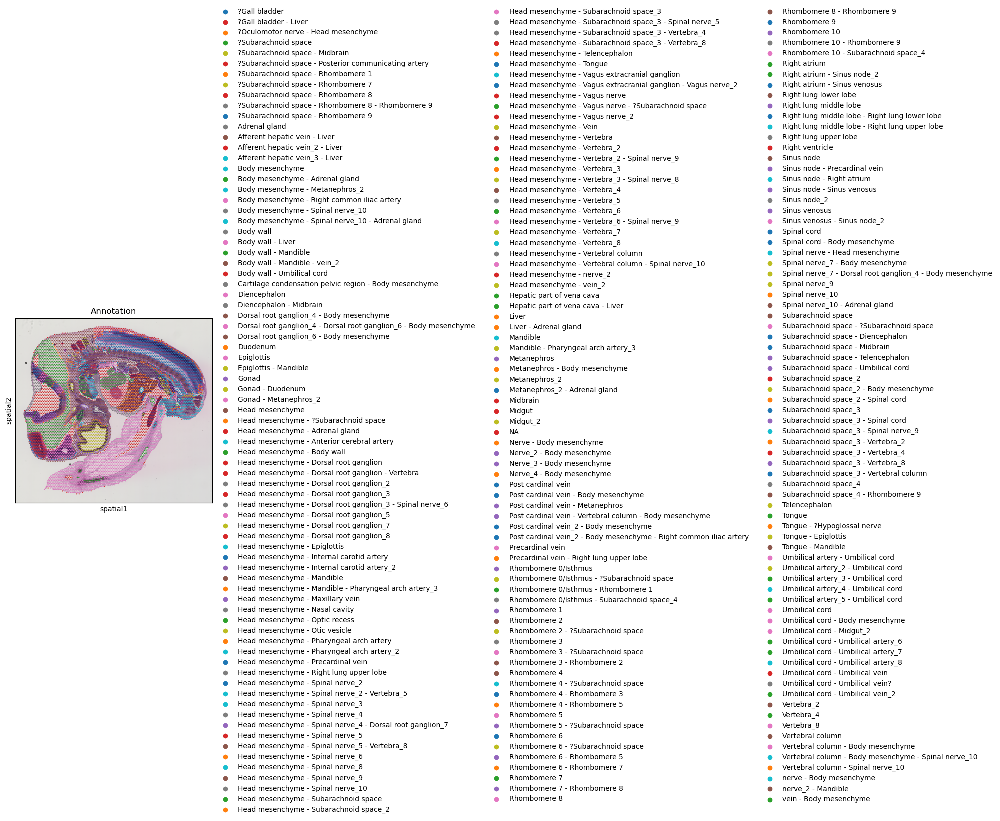

WTSI_wEMBsp13458609_anndata_with_annotations.h5ad


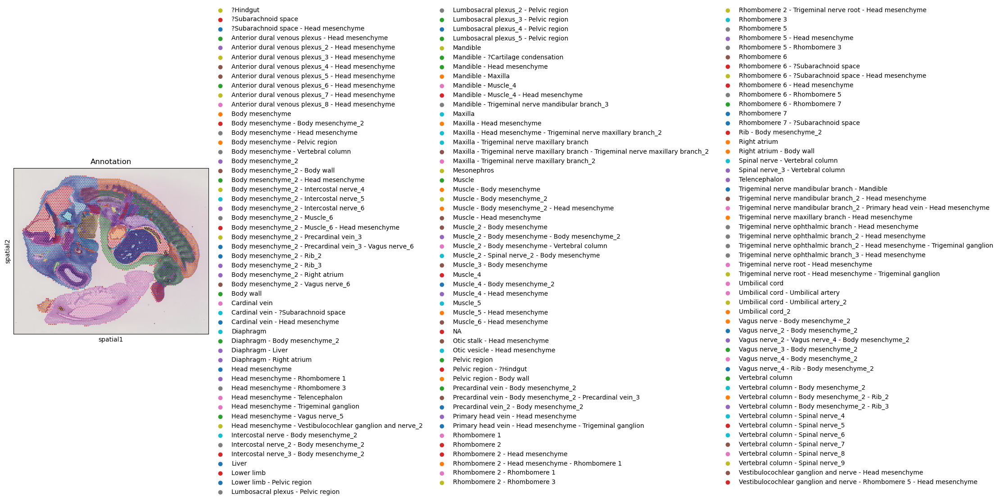

WTSI_wEMBsp13458120_anndata_with_annotations.h5ad


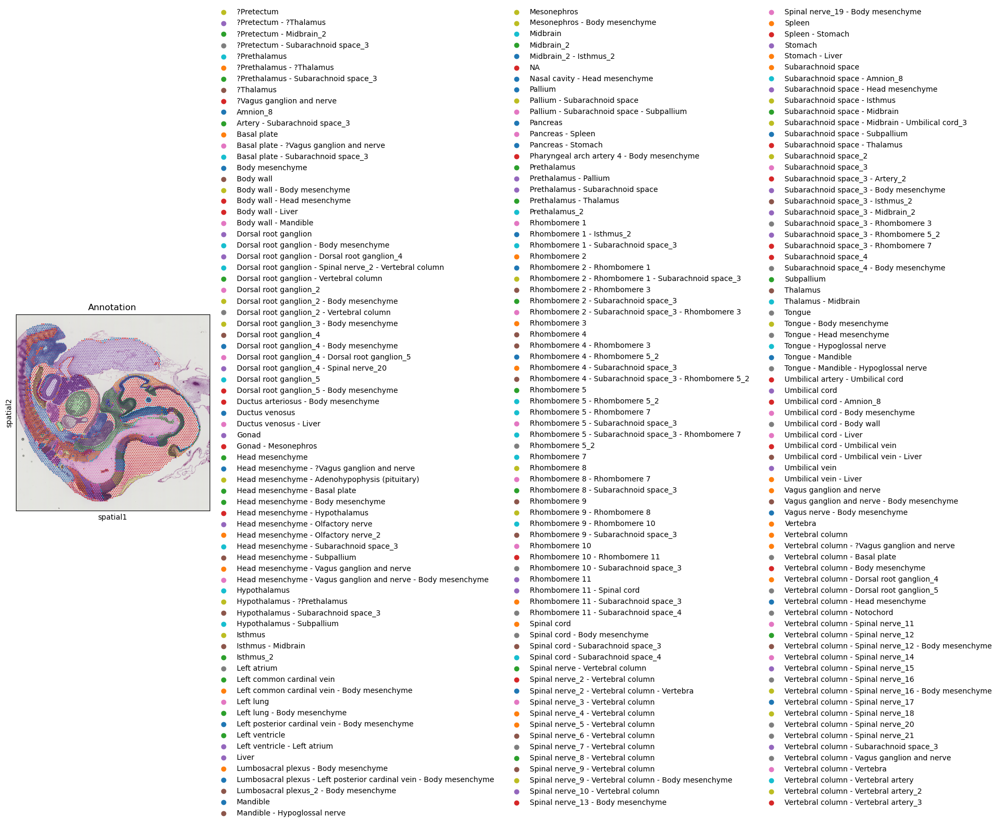

WTSI_wEMBsp13458130_anndata_with_annotations.h5ad


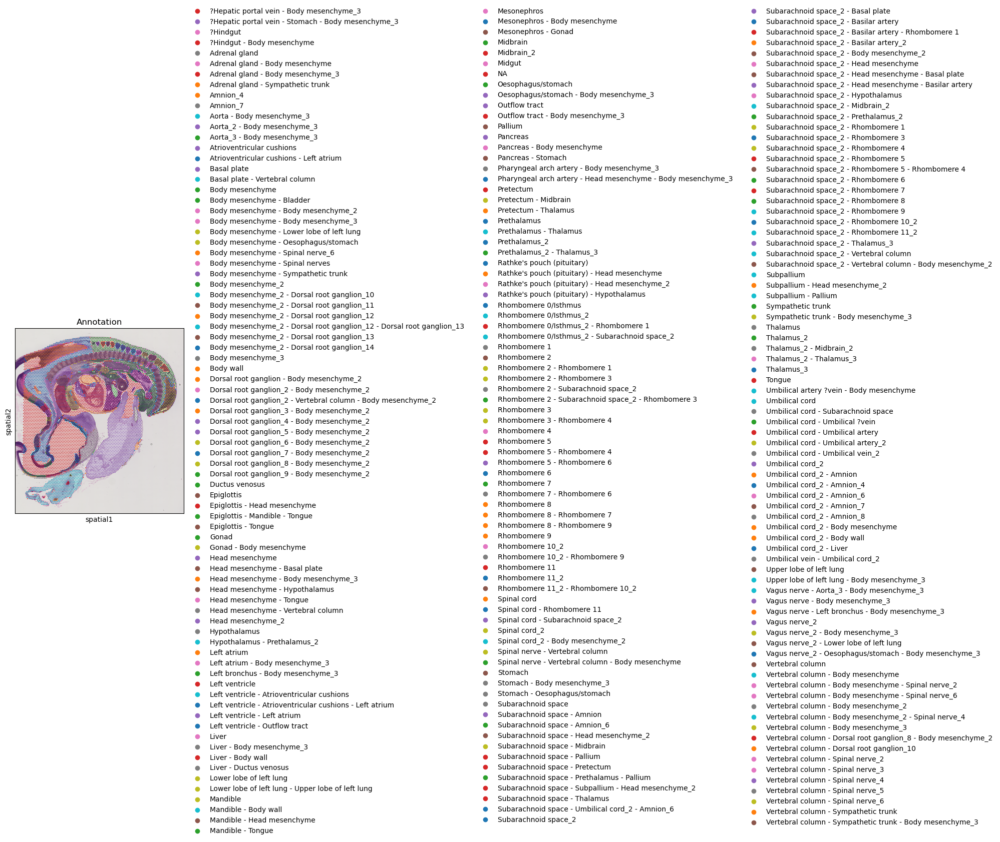

WTSI_wEMBsp13458133_anndata_with_annotations.h5ad


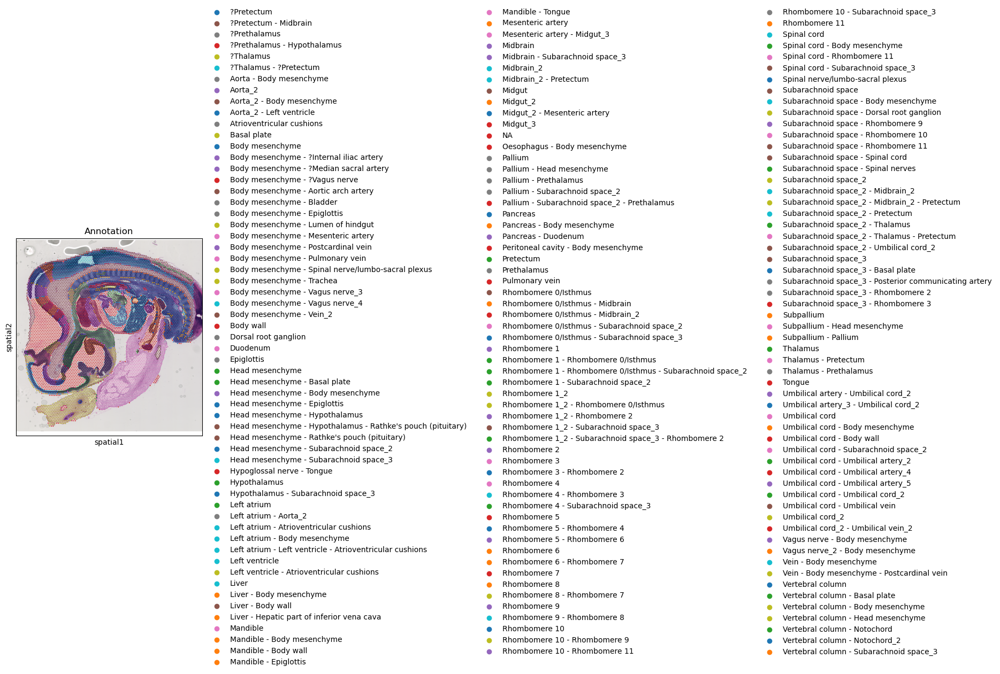

In [11]:
for p in h5ad_paths:
    print(p.split("/")[-1])
    adata = sc.read_h5ad(p)
    colors = ["tab:red", "tab:blue", "tab:green", "tab:purple", "tab:orange", "tab:brown", "tab:pink", "tab:gray", "tab:olive", "tab:cyan"]
    color_palette = {c:colors[i%len(colors)] for i, c in enumerate(adata.obs.Annotation.unique())}
    sc.pl.spatial(adata, color="Annotation", palette=color_palette)
    plt.show()

In [6]:
h5ad_paths = glob('output_all/*h5ad')
h5ad_paths

['output_all/LP_GBM-spaceranger130_count_46869_GBM_SPA13612887_GRCh38-2020-A_anndata_with_annotations.h5ad',
 'output_all/LP_GBM-spaceranger200_count_45730_GBM_SPA13091861_GRCh38-2020-A_anndata_with_annotations.h5ad',
 'output_all/LP_GBM-spaceranger130_count_45132_GBM_SPA12928183_GRCh38-2020-A_anndata_with_annotations.h5ad',
 'output_all/LP_GBM-spaceranger200_count_45730_GBM_SPA13091855_GRCh38-2020-A_anndata_with_annotations.h5ad',
 'output_all/LP_GBM-spaceranger200_count_45730_GBM_SPA13091847_GRCh38-2020-A_anndata_with_annotations.h5ad',
 'output_all/LP_GBM-spaceranger200_count_46451_GBM_SPA13266279_GRCh38-2020-A_anndata_with_annotations.h5ad',
 'output_all/LP_GBM-spaceranger130_count_46869_GBM_SPA13612886_GRCh38-2020-A_anndata_with_annotations.h5ad',
 'output_all/LP_GBM-spaceranger130_count_45272_GBM_SPA12944635_GRCh38-2020-A_anndata_with_annotations.h5ad',
 'output_all/LP_GBM-spaceranger200_count_46451_GBM_SPA13266280_GRCh38-2020-A_anndata_with_annotations.h5ad',
 'output_all/LP_GBM

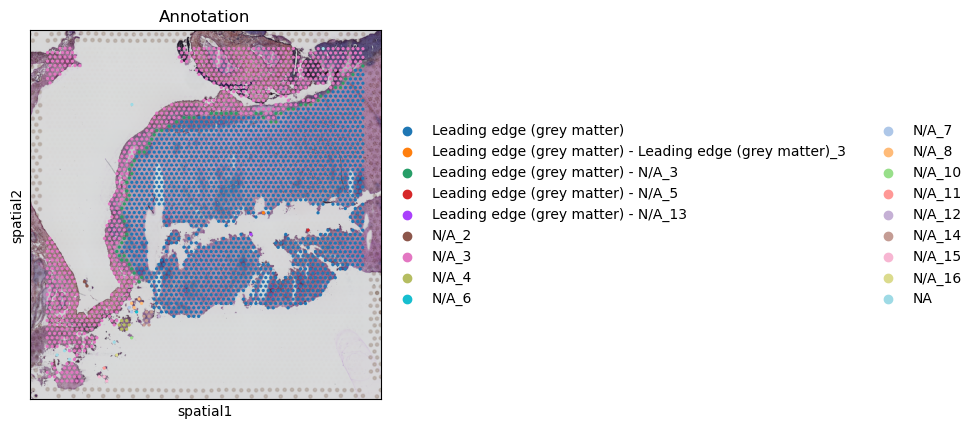

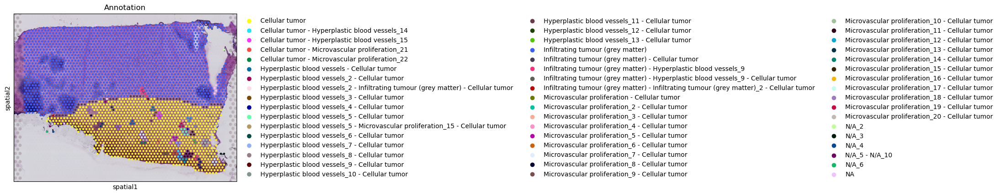

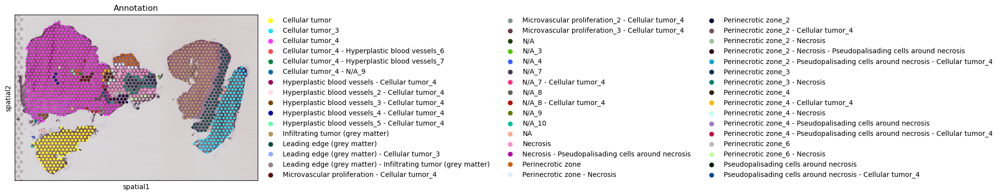

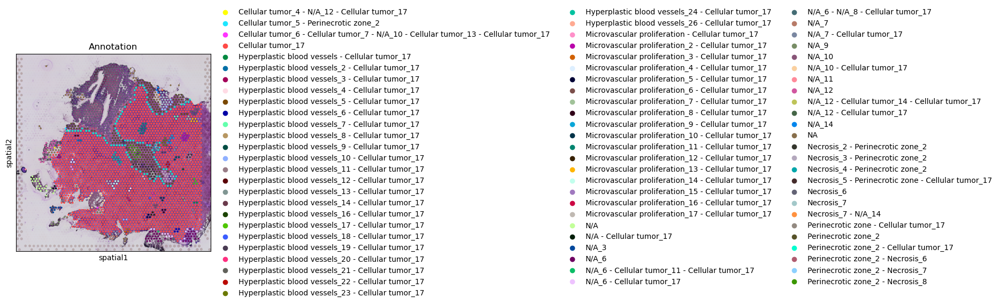

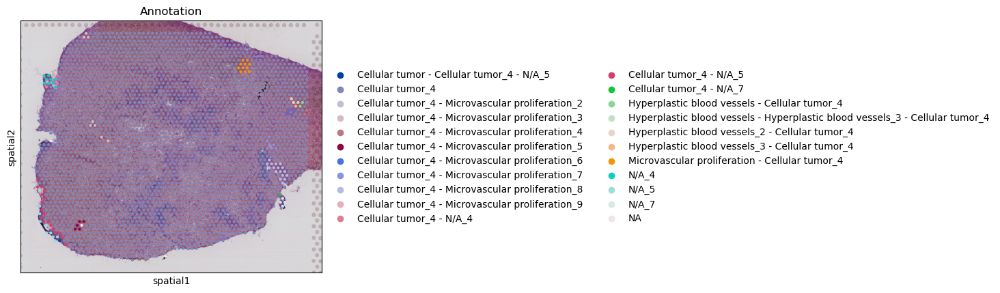

...

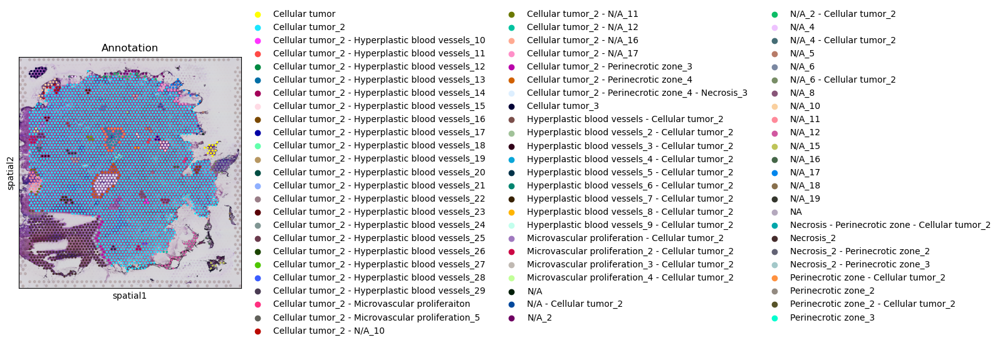

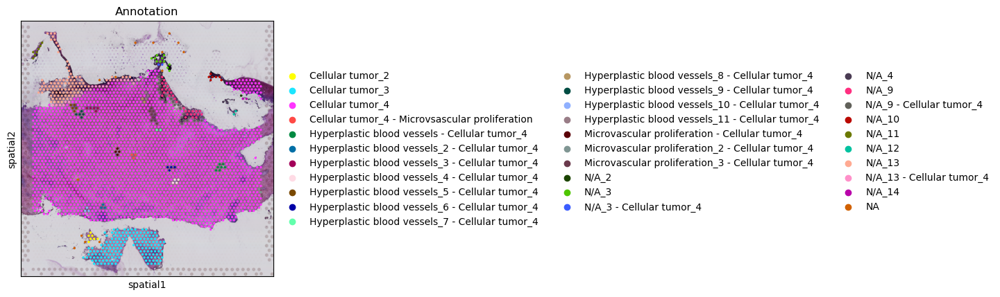

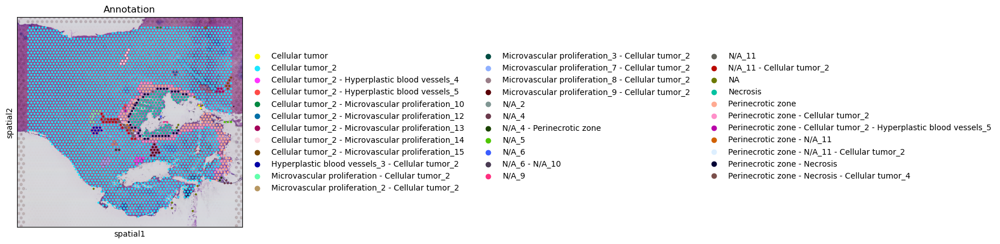

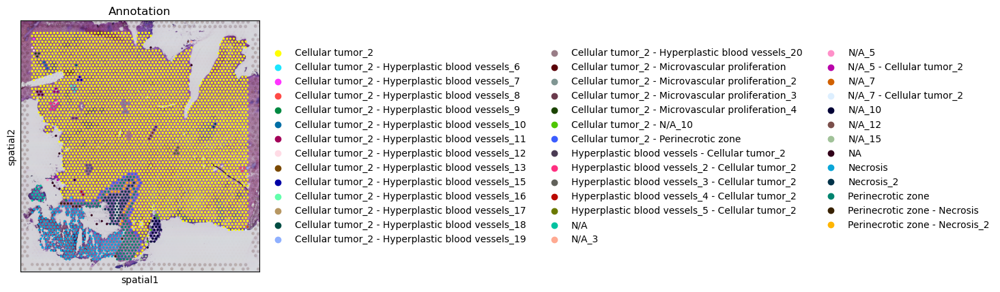

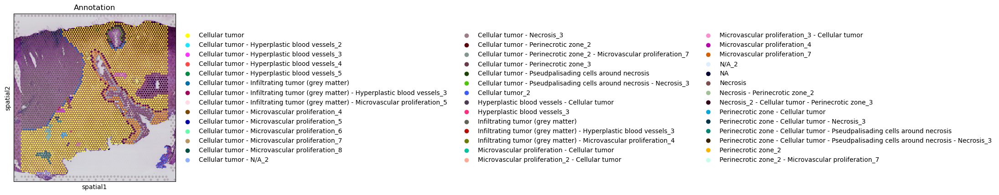

In [7]:
for p in h5ad_paths:
    adata = sc.read_h5ad(p)
    sc.pl.spatial(adata, color="Annotation")
    plt.show()

In [4]:
import scanpy as sc

In [62]:
from aicsimageio import AICSImage
import matplotlib.pyplot as plt

In [55]:
img = AICSImage("/nfs/t292_imaging/FW_ORG/playground_Tong/20231004_static_3d_seg/488-cyan 647-magenta 568-yellow DAPI-grey/GFP(1) GFP-488 Nanog-568 SOX2-647.r-52.tif")

In [71]:
dapi = img.get_image_dask_data("XY", C=0, T=0, Z=20)

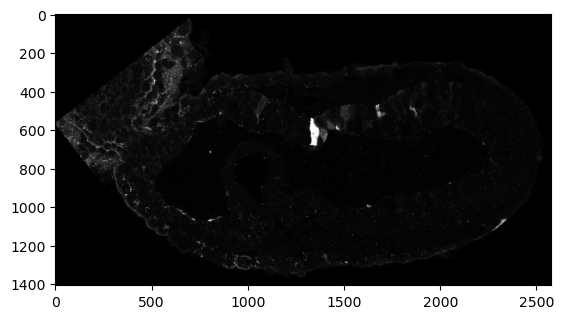

In [72]:
plt.imshow(dapi.compute(), cmap="gray")

In [5]:
import numpy as np
import pickle
import scanpy as sc
import pandas as pd

In [6]:
adata_pilot2 = sc.read_h5ad("/nfs/t233_imaging/NT_SNP/playground_Tong/Pilot_2/assign/NT_SNP.h5ad")
adata_pilot1 = sc.read_h5ad("/nfs/t233_imaging/NT_SNP/playground_Tong/Pilot_1/assign/NT_SNP_pilot_1.h5ad")

In [7]:
adata_pilot2

AnnData object with n_obs × n_vars = 76702 × 1
    obs: 'sample', 'total_counts', 'n_genes_by_counts'
    var: 'total_counts', 'n_cells_by_counts'
    obsm: 'spatial'

In [8]:
adata_pilot1

AnnData object with n_obs × n_vars = 99040 × 1
    obs: 'sample', 'total_counts', 'n_genes_by_counts'
    var: 'total_counts', 'n_cells_by_counts'
    obsm: 'spatial'

In [9]:
feats_pilot2 = pd.read_csv("/nfs/t233_imaging/NT_SNP/playground_Tong/Pilot_2/segmentation/Pilot_2_serie_0_features.csv", index_col='label')
feats_pilot1 = pd.read_csv("/nfs/t233_imaging/NT_SNP/playground_Tong/Pilot_1/segmentation/Pilot_1_serie_0_features.csv", index_col='label')

In [10]:
sub_feats_pilot1 = feats_pilot1[feats_pilot1.index.isin(adata_pilot1.obs.index.astype(int))]
sub_feats_pilot1.index = sub_feats_pilot1.index.astype(str)
sub_feats_pilot1

,centroid-0,centroid-1,bbox-0,bbox-1,bbox-2,bbox-3,axis_major_length,axis_minor_length,area,equivalent_diameter_area,solidity,area_convex
label,,,,,,,,,,,,
1,2496.498429,38045.958639,2434,37995,2569,38107,134.993041,109.784764,11460.0,120.794558,0.983944,11647.0
2,2533.211678,51055.700037,2473,50977,2585,51128,144.389880,96.846745,10738.0,116.927526,0.967736,11096.0
3,2564.980277,38167.723307,2518,38126,2613,38209,108.051447,62.601819,5273.0,81.937733,0.972878,5420.0
4,2639.451025,38158.745441,2599,38118,2681,38207,92.450610,76.718935,5319.0,82.294357,0.951350,5591.0
5,2737.666867,36609.064759,2701,36577,2773,36637,74.692531,58.203605,3320.0,65.016577,0.977045,3398.0
...,...,...,...,...,...,...,...,...,...,...,...,...
141608,72291.893526,8694.239968,72258,8659,72327,8730,71.954022,66.253136,3738.0,68.988183,0.983943,3799.0
141609,72294.712919,8178.309410,72255,8121,72341,8237,119.800876,76.267470,6897.0,93.709835,0.904762,7623.0
141611,72353.985746,8194.626198,72321,8157,72390,8232,76.650667,68.025619,4069.0,71.977856,0.980010,4152.0


In [11]:
sub_feats_pilot2 = feats_pilot2[feats_pilot2.index.isin(adata_pilot2.obs.index.astype(int))]
sub_feats_pilot2.index = sub_feats_pilot2.index.astype(str)
sub_feats_pilot2

,centroid-0,centroid-1,bbox-0,bbox-1,bbox-2,bbox-3,axis_major_length,axis_minor_length,area,equivalent_diameter_area,solidity,area_convex
label,,,,,,,,,,,,
14,1139.439076,34805.693190,1097,34749,1182,34859,104.768779,81.420728,6623.0,91.829546,0.966438,6853.0
140,1443.163399,35939.888889,1423,35914,1456,35969,65.175293,5.929929,153.0,13.957279,0.458084,334.0
142,1449.005831,36481.133382,1418,36452,1487,36508,70.305958,52.834906,2744.0,59.108115,0.919263,2985.0
172,1501.971963,36012.168224,1493,36005,1512,36020,19.238294,14.514004,214.0,16.506764,0.922414,232.0
231,1656.941878,34483.851296,1601,34441,1713,34536,107.269356,94.326964,7794.0,99.617413,0.973520,8006.0
...,...,...,...,...,...,...,...,...,...,...,...,...
96441,62678.473457,41368.030967,62623,41313,62736,41426,114.620463,105.953055,9494.0,109.946061,0.978763,9700.0
96442,62676.704422,39527.490950,62628,39491,62724,39563,97.236613,71.137315,5359.0,82.603213,0.968903,5531.0
96443,62680.586151,39103.167240,62643,39059,62715,39151,99.707908,64.515328,4939.0,79.300253,0.952555,5185.0


In [23]:
combined_df_pilot1 = pd.merge(left=adata_pilot1.obs, right=sub_feats_pilot1, left_index=True, right_index=True)
combined_df_pilot1

,sample,total_counts,n_genes_by_counts,centroid-0,centroid-1,bbox-0,bbox-1,bbox-2,bbox-3,axis_major_length,axis_minor_length,area,equivalent_diameter_area,solidity,area_convex
1,NT_SNP_pilot_1,23.0,1,2496.498429,38045.958639,2434,37995,2569,38107,134.993041,109.784764,11460.0,120.794558,0.983944,11647.0
2,NT_SNP_pilot_1,13.0,1,2533.211678,51055.700037,2473,50977,2585,51128,144.389880,96.846745,10738.0,116.927526,0.967736,11096.0
3,NT_SNP_pilot_1,3.0,1,2564.980277,38167.723307,2518,38126,2613,38209,108.051447,62.601819,5273.0,81.937733,0.972878,5420.0
4,NT_SNP_pilot_1,6.0,1,2639.451025,38158.745441,2599,38118,2681,38207,92.450610,76.718935,5319.0,82.294357,0.951350,5591.0
5,NT_SNP_pilot_1,6.0,1,2737.666867,36609.064759,2701,36577,2773,36637,74.692531,58.203605,3320.0,65.016577,0.977045,3398.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
141608,NT_SNP_pilot_1,1.0,1,72291.893526,8694.239968,72258,8659,72327,8730,71.954022,66.253136,3738.0,68.988183,0.983943,3799.0
141609,NT_SNP_pilot_1,1.0,1,72294.712919,8178.309410,72255,8121,72341,8237,119.800876,76.267470,6897.0,93.709835,0.904762,7623.0
141611,NT_SNP_pilot_1,1.0,1,72353.985746,8194.626198,72321,8157,72390,8232,76.650667,68.025619,4069.0,71.977856,0.980010,4152.0
141616,NT_SNP_pilot_1,1.0,1,72450.821022,8089.356576,72390,8039,72514,8132,136.701638,56.460747,5794.0,85.890337,0.907439,6385.0


In [24]:
combined_df_pilot2 = pd.merge(left=adata_pilot2.obs, right=sub_feats_pilot2, left_index=True, right_index=True)
combined_df_pilot2

,sample,total_counts,n_genes_by_counts,centroid-0,centroid-1,bbox-0,bbox-1,bbox-2,bbox-3,axis_major_length,axis_minor_length,area,equivalent_diameter_area,solidity,area_convex
14,NT_SNP,1.0,1,1139.439076,34805.693190,1097,34749,1182,34859,104.768779,81.420728,6623.0,91.829546,0.966438,6853.0
140,NT_SNP,2.0,1,1443.163399,35939.888889,1423,35914,1456,35969,65.175293,5.929929,153.0,13.957279,0.458084,334.0
142,NT_SNP,1.0,1,1449.005831,36481.133382,1418,36452,1487,36508,70.305958,52.834906,2744.0,59.108115,0.919263,2985.0
172,NT_SNP,1.0,1,1501.971963,36012.168224,1493,36005,1512,36020,19.238294,14.514004,214.0,16.506764,0.922414,232.0
231,NT_SNP,1.0,1,1656.941878,34483.851296,1601,34441,1713,34536,107.269356,94.326964,7794.0,99.617413,0.973520,8006.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96441,NT_SNP,39.0,1,62678.473457,41368.030967,62623,41313,62736,41426,114.620463,105.953055,9494.0,109.946061,0.978763,9700.0
96442,NT_SNP,27.0,1,62676.704422,39527.490950,62628,39491,62724,39563,97.236613,71.137315,5359.0,82.603213,0.968903,5531.0
96443,NT_SNP,64.0,1,62680.586151,39103.167240,62643,39059,62715,39151,99.707908,64.515328,4939.0,79.300253,0.952555,5185.0
96444,NT_SNP,22.0,1,62682.721471,27094.549102,62612,27029,62739,27181,152.456154,106.859282,11690.0,122.000698,0.917726,12738.0


In [31]:
combined_df_pilot2_sub = combined_df_pilot2[combined_df_pilot2.area >= 1000]
combined_df_pilot1_sub = combined_df_pilot1[combined_df_pilot1.area >= 1000]

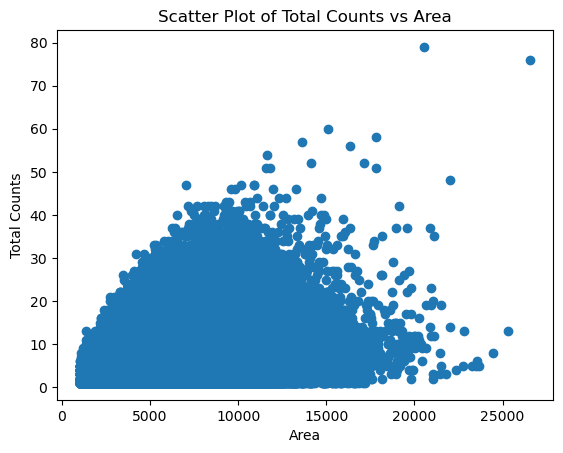

In [32]:
import matplotlib.pyplot as plt

plt.scatter(combined_df_pilot1_sub['area'], combined_df_pilot1_sub['total_counts'])
plt.xlabel('Area')
plt.ylabel('Total Counts')
plt.title('Scatter Plot of Total Counts vs Area')
plt.show()

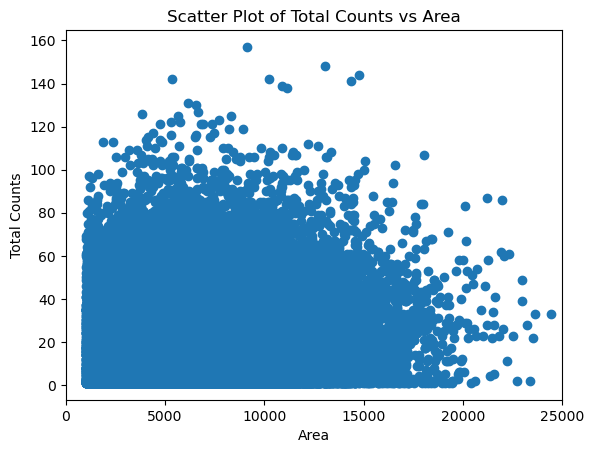

In [33]:
import matplotlib.pyplot as plt

plt.scatter(combined_df_pilot2_sub['area'], combined_df_pilot2_sub['total_counts'])
plt.xlim(0, 25000)
plt.xlabel('Area')
plt.ylabel('Total Counts')
plt.title('Scatter Plot of Total Counts vs Area')
plt.show()

In [50]:
combined_df_pilot1.to_csv("/nfs/t233_imaging/NT_SNP/playground_Tong/Pilot_1/for_spot_count_QC/pilot1_combined_df.csv")

In [1]:
combined_df_pilot2.to_csv("/nfs/t233_imaging/NT_SNP/playground_Tong/Pilot_2/for_spot_count_QC/pilot2_combined_df.csv")

NameError: name 'combined_df_pilot2' is not defined

In [3]:
import anndata as ad

def remove_gene(anndata_obj, gene_name):
    """
    Remove a gene from an anndata object and return a copy of the object.

    Parameters:
    anndata_obj (anndata.AnnData): An anndata object.
    gene_name (str): The name of the gene to be removed.

    Returns:
    anndata.AnnData: A copy of the input anndata object with the specified gene removed.
    """
    # Make a copy of the input object
    new_anndata_obj = anndata_obj.copy()

    # Remove the specified gene from the copy
    new_anndata_obj = new_anndata_obj[:, ~new_anndata_obj.var_names.isin([gene_name])]

    return new_anndata_obj

adata = ad.read_h5ad("/lustre/scratch126/cellgen/team283/tl10/Stabmap_scripts/data/ISS/HZ_HLB_hindlimb.h5ad")
for gene_name in adata.var_names:
    print(gene_name)
    gene_removed = remove_gene(adata, gene_name)
    gene_removed.write_h5ad("h5ads_with_one_gene_removed_for_Stabmap_imputation/HZ_HLB_hindlimb_gene_removed_{}.h5ad".format(gene_name))


ABI3BP
ACTG2
APLNR
APOD
ARHGDIB
ASPN
BTC
C1QA
C1QC
CAPS
CAV1
CAVIN2
CCL21
CCN3
CHODL
CHRND
CKB
CLDN11
CLDN4
CLU
COL14A1
COL2A1
COL9A2
COMP
CSRP2
CTSC
CXCL14
DES
DSC2
EGFL6
ELN
EMCN
EMX2
F13A1
FGFBP2
FRZB
FST
GAS2
GFRA3
GPNMB
HBQ1
HBZ
HEMGN
HMBS
HMGA1
KCNJ8
KERA
KRT19
MATN1
MATN3
MATN4
MEF2C
MEOX2
MPZ
MSC
MT1G
MYF5
MYH11
MYH3
MYOD1
MYOG
NGFR
NNAT
NOTCH4
NR2F2
NSG1
PAX3
PIM1
PITX2
PLN
PLP2
PLVAP
PRND
S100A10
SCRG1
SEMA3B
SFRP1
SFRP2
SLN
SPON2
SST
STAC3
TACSTD2
TAGLN
THBS4
TNMD
TPPP3
TTN
TWIST2
UCMA


: 

In [9]:
# pip install s3fs zarr anndata
import s3fs
import zarr
import anndata

# horribleness for Sanger
s3 = s3fs.S3FileSystem(anon=True, client_kwargs = {
    'endpoint_url':"https://cog.sanger.ac.uk",
    'region_name':'us-east-1'
})

# path to anndata.zarr
s3_store = 'xenium/public/KR_XEN/KR_XEN-output-XETG00155__0004120__Region_2__20231011__125831-anndata.zarr'

# create zarr store
store = s3fs.S3Map(root=s3_store,s3=s3)

#open anndata
adata = anndata.read_zarr(store)

TypeError: AioSession.__init__() got an unexpected keyword argument 's3_access_key'

In [12]:
s3 = s3fs.S3FileSystem(
    key='BVL5SNR8PT40W4BRMRIC',
    secret='SbqLPWAiqZ1tc0HnIBvYejLG2Bdf5jTDmZAcwzG6',
    client_kwargs = {
        'endpoint_url':"https://cog.sanger.ac.uk",
        'region_name':'us-east-1'
    }
)

In [13]:
store = s3fs.S3Map('s3://webatlasdataprod/public/Xenium_1/KR_XEN-SAT_10625_R1-anndata.zarr', s3=s3)
zarr_file = zarr.open(store, mode='r')

TypeError: AioSession.__init__() got an unexpected keyword argument 's3_access_key'

In [7]:
import pandas as pd
import matplotlib.pyplot as plt

In [3]:
df = pd.read_csv("20240123/WTSI_wEMBsp13458130.csv")

In [9]:
import numpy as np
arr = df.values.flatten()
# Assuming your array is named 'arr'
non_zero_arr = arr[np.nonzero(arr)]

(array([5.650e+02, 5.580e+02, 5.690e+02, 5.460e+02, 5.350e+02, 5.510e+02,
        5.480e+02, 5.510e+02, 5.540e+02, 5.500e+02, 5.360e+02, 5.300e+02,
        5.050e+02, 2.600e+01, 2.600e+01, 2.400e+01, 2.500e+01, 1.900e+01,
        3.100e+01, 2.400e+01, 1.600e+01, 2.800e+01, 1.800e+01, 3.300e+01,
        2.800e+01, 1.900e+01, 2.000e+01, 1.700e+01, 2.000e+01, 2.300e+01,
        2.100e+01, 2.700e+01, 2.900e+01, 1.800e+01, 2.400e+01, 2.100e+01,
        2.500e+01, 1.900e+01, 2.500e+01, 1.900e+01, 2.400e+01, 2.700e+01,
        3.000e+01, 2.500e+01, 1.800e+01, 2.200e+01, 2.500e+01, 2.400e+01,
        1.900e+01, 1.300e+01, 9.000e+00, 2.700e+01, 1.900e+01, 1.700e+01,
        2.300e+01, 2.000e+01, 2.400e+01, 1.500e+01, 2.300e+01, 1.900e+01,
        2.000e+01, 2.000e+01, 1.900e+01, 3.000e+01, 2.300e+01, 2.100e+01,
        2.200e+01, 3.500e+01, 1.800e+01, 2.400e+01, 3.000e+01, 2.500e+01,
        2.300e+01, 2.000e+01, 3.700e+01, 3.000e+01, 2.500e+01, 2.800e+01,
        3.000e+01, 3.000e+01, 3.300e+0

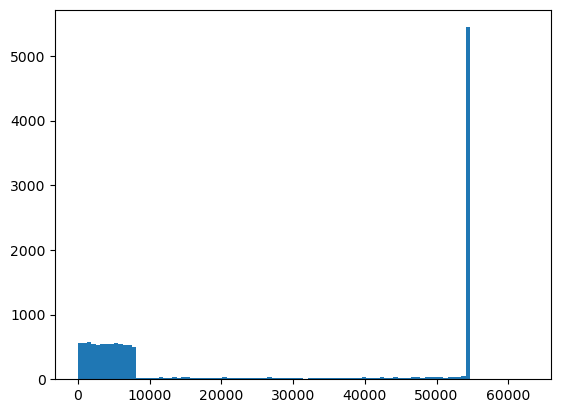

In [13]:
plt.hist(non_zero_arr, bins=100)

In [14]:
np.mode(non_zero_arr)

AttributeError: module 'numpy' has no attribute 'mode'